# Plotting animations of land cover <img align="right" src="../Supplementary_data/dea_logo.jpg">

* [**Sign up to the DEA Sandbox**](https://docs.dea.ga.gov.au/setup/sandbox.html) to run this notebook interactively from a browser
* **Compatibility:** Notebook currently compatible with the `DEA Sandbox` environment
* **Products used:** 
[ga_ls_landcover_class_cyear_2](https://explorer.sandbox.dea.ga.gov.au/products/ga_ls_landcover_class_cyear_2)
* This is a modified version of the DEA [notebook](https://github.com/GeoscienceAustralia/dea-notebooks/blob/develop/Frequently_used_code/Land_cover_animated_plots.ipynb)


## Background

Land cover is the physical surface of the Earth, including trees, shrubs, grasses, soils, exposed rocks, water bodies, plantations, crops and built structures.
Digital Earth Australia Land Cover (DEA Land Cover) is a continental dataset that maps annual land cover classifications for Australia from 1988 to the present. 
Detailed information about DEA Land Cover can be found in the [DEA Land Cover notebook](../DEA_datasets/DEA_Land_Cover.ipynb) and on the [DEA Land Cover product details](https://cmi.ga.gov.au/data-products/dea/607/dea-land-cover-landsat#details) page.

This modified version is used to look at land use change in catchments in the south east of South Australia.

### Load packages

In [10]:
%matplotlib inline

import math
import os
import sys

import datacube
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd

sys.path.insert(1, os.path.abspath("../Tools"))
from dea_tools.landcover import lc_animation, plot_land_cover
from dea_tools.plotting import display_map
from dea_tools.spatial import xr_rasterize
from dea_tools.plotting import rgb, map_shapefile

### Connect to the datacube
Connect to the datacube so we can access DEA data. 

In [2]:
dc = datacube.Datacube(app="Land_cover_animated_plots")

### Create query and load a time series of land cover data

In order to generate animations of DEA Land Cover, we first need to load a time series of data for an area. 
As an example, let's load both the base 6-class classification (Level 3) layer and the full classification (Level 4) layer based on a shapefile bounding box.

In [3]:
gdf = gpd.read_file('shp/Model_Domain.shp')
bounds=gpd.GeoDataFrame(gdf).to_crs("EPSG:4326").bounds

#bounds need to be slightly larger for later clip to work
lon=(bounds.minx,bounds.maxx)
lat=(bounds.miny,bounds.maxy)
display_map(x=lon, y=lat)

In [6]:
# Build query and load data
query = {
    "y": lat,
    "x": lon,
    "time": ("2011", "2015"),
}

# Load DEA Land Cover data from the datacube
land_cover_data = dc.load(
    product="ga_ls_landcover_class_cyear_2",
    output_crs="EPSG:3577",
    #measurements=["level3", "level4", "waterper_wat_cat_l4d_au"],
    measurements=["lifeform"],
    resolution=(-25, 25),
    **query
)

In [15]:
# See what we have loaded
plot_land_cover(land_cover_data.median().lifeform)

AttributeError: 'NoneType' object has no attribute 'shape'

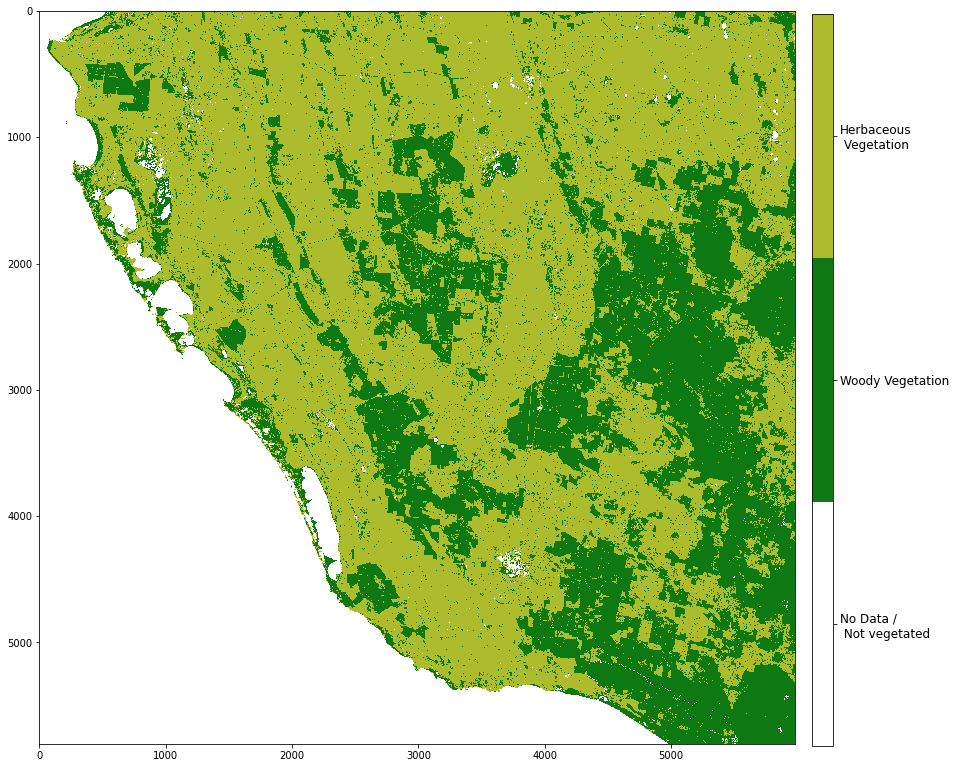

In [19]:
plot_land_cover(land_cover_data.median(dim='time').lifeform)

In [ ]:
land_cover_data.median(dim='time').to_array().lifeform

## Plot land cover animations 

### Plot default animation of Level 3 data

`lc_animation()` has a number of options for controlling the inclusion of colour bars and tick marks and the ability to add an animated stacked line plot beside the animated map. 
To begin, let's plot the Level 3 layer with all default options. 
This will plot a single animated map with tick marks and no colour bar. A copy of the animation will be saved to file as `default_animation.gif`. 
This name can be changed by providing an alternative as the variable `file_name` as will be done in following examples.

In [19]:
# Select Level 4 data
level_4 = land_cover_data["level4"]
level_4

<xarray.DataArray 'level4' (time: 33, y: 5803, x: 5986)>
array([[[101, 101, 101, ...,  34,  34,  34],
        [101, 101, 101, ...,  34,  34,  34],
        [101, 101, 101, ...,  34,  34,  34],
        ...,
        [101, 101, 101, ...,  28,  28,  28],
        [101, 101, 101, ...,  28,  28,  28],
        [101, 101, 101, ...,  28,  28,  28]],

       [[101, 101, 101, ...,  35,  35,  35],
        [101, 101, 101, ...,  35,  35,  35],
        [101, 101, 101, ...,  35,  35,  35],
        ...,
        [101, 101, 101, ...,  27,  28,  28],
        [101, 101, 101, ...,  28,  28,  28],
        [101, 101, 101, ...,  28,  28,  28]],

       [[101, 101, 101, ...,  14,  15,  15],
        [101, 101, 101, ...,  14,  14,  14],
        [101, 101, 101, ...,  14,  14,  14],
        ...,
...
        ...,
        [101, 101, 101, ...,  27,  27,  28],
        [101, 101, 101, ...,  28,  28,  28],
        [101, 101, 101, ...,  28,  28,  28]],

       [[101, 101, 101, ...,  16,  16,  16],
        [101, 101, 101, ...,  16,  16,  16],
        [101, 101, 101, ...,  16,  16,  16],
        ...,
        [101, 101, 101, ...,  28,  28,  28],
        [101, 101, 101, ...,  28,  28,  28],
        [101, 101, 101, ...,  28,  28,  28]],

       [[101, 101, 101, ...,  14,  14,  14],
        [101, 101, 101, ...,  14,  14,  14],
        [101, 101, 101, ...,  14,  14,  14],
        ...,
        [103, 103, 103, ...,  28,  27,  28],
        [103, 103, 103, ...,  28,  28,  27],
        [103, 103, 103, ...,  28,  28,  28]]], dtype=uint8)
Coordinates:
  * time         (time) datetime64[ns] 1988-01-01 1989-01-01 ... 2020-01-01
  * y            (y) float64 -4.053e+06 -4.053e+06 ... -4.198e+06 -4.198e+06
  * x            (x) float64 6.832e+05 6.833e+05 ... 8.328e+05 8.329e+05
    spatial_ref  int32 3577
Attributes:
    units:         1
    nodata:        0
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

In [7]:
mask = xr_rasterize(gdf, level_4)
mask

<xarray.DataArray (y: 1534, x: 2160)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
Coordinates:
  * y        (y) float64 -4.061e+06 -4.061e+06 ... -4.099e+06 -4.099e+06
  * x        (x) float64 7.787e+05 7.787e+05 7.787e+05 ... 8.326e+05 8.327e+05
Attributes:
    units:         1
    nodata:        0
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

Clip the data to the shapefile boundary

In [8]:
level_4 = level_4.where(mask)

In [9]:
import scipy
#calculate the most common (mode) pixel over time 

#https://stackoverflow.com/questions/56329034/is-there-a-way-to-aggregate-an-xarrray-dataarray-by-calculating-the-mode-for-eac
def _mode(*args, **kwargs):
    vals = scipy.stats.mode(*args, **kwargs)
    # only return the mode (discard the count)
    return vals[0].squeeze()


def mode(obj,dim='time'):
    # note: apply always moves core dimensions to the end
    # usually axis is simply -1 but scipy's mode function doesn't seem to like that
    # this means that this version will only work for DataArray's (not Datasets)
    assert isinstance(obj, xr.DataArray)
    axis = obj.ndim - 1
    return xr.apply_ufunc(_mode, obj,
                          input_core_dims=[[dim]],
                          kwargs={'axis': axis})

In [20]:
LU2015=level_4.sel(time=slice('2010-01-01', '2015-01-01'))

In [21]:
LU2015mode=mode(LU2015)

In [31]:
np.unique(LU2015mode.data)
LU2015mode=LU2015mode.rio.write_nodata(LU2015mode.rio.nodata, encoded=True, inplace=True)

In [22]:
import rioxarray
LU2015mode.rio.to_raster("LU2015_SE.tif", compress='LZW', dtype="uint8")

### Plot animation with a stacked line plot

Adding the optional setting `stacked_plot=True` will generate a stacked line plot that is synchronised with the animated map. The stacked line plot shows what percentage of the map is taken up by each class in each year.
For this example we will use the full classification, Level 4 layer.

In [62]:
np.unique(level_4.data)

array([  0.,  14.,  15.,  16.,  17.,  18.,  27.,  28.,  29.,  30.,  31.,
        32.,  33.,  34.,  35.,  36.,  93.,  94.,  95.,  96.,  97.,  99.,
       101., 102., 103., 104.,  nan])

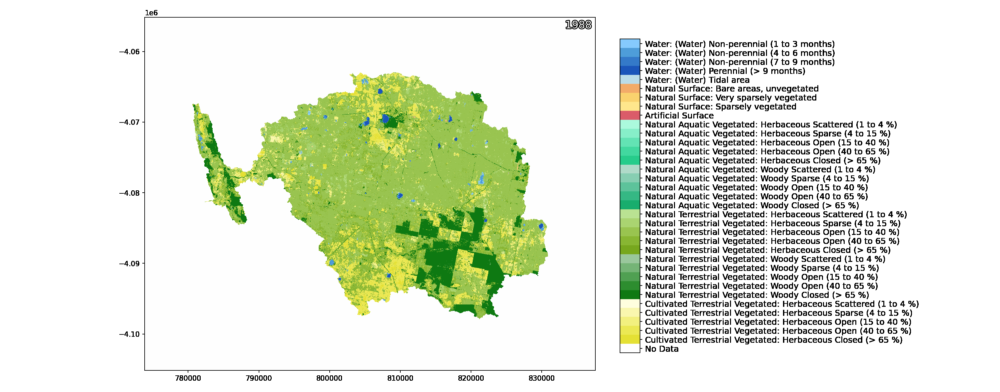

In [67]:
# Set file name
file_name = "level_4_with_stacked_plot"

# Generate plot
lc_animation(level_4, file_name=file_name,colour_bar=True) #stacked area bar doesn't play well with nan's introduced by the mask

## Modifying `lc_animation()`
`lc_animation()` contains many optional parameters allowing customisation of the appearance of the land cover animations. 
Below are examples of how some of them operate. 
For the full details of the parameters please refer to the [land_cover.py](../Tools/dea_tools/land_cover.py) file.


### Plot animation with colour bar

A colour bar can be added to the stand alone animation by including the optional setting `colour_bar=True`.  
> **Note:**  The colour bar does not work with the stacked line plot option.

Let's generate an example using the water persistence layer.



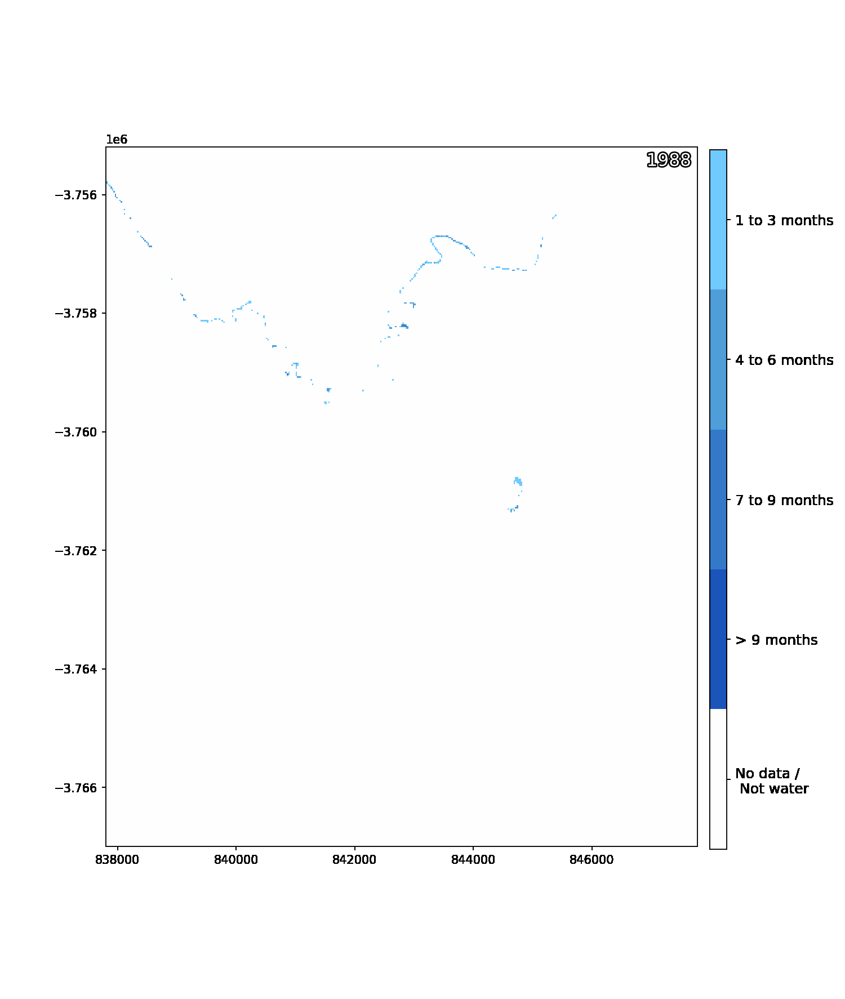

In [8]:
# Select water persistance layer
water_per = land_cover_data["waterper_wat_cat_l4d_au"]

# Set file name
file_name = "water_persistence_animation"

# Generate plot
lc_animation(water_per, file_name=file_name, colour_bar=True)

### Plot with no axes ticks

If you want to make an animation for communication purposes, perhaps you don't want to have any tick marks on the axes. In this case you include `label_ax=False`.

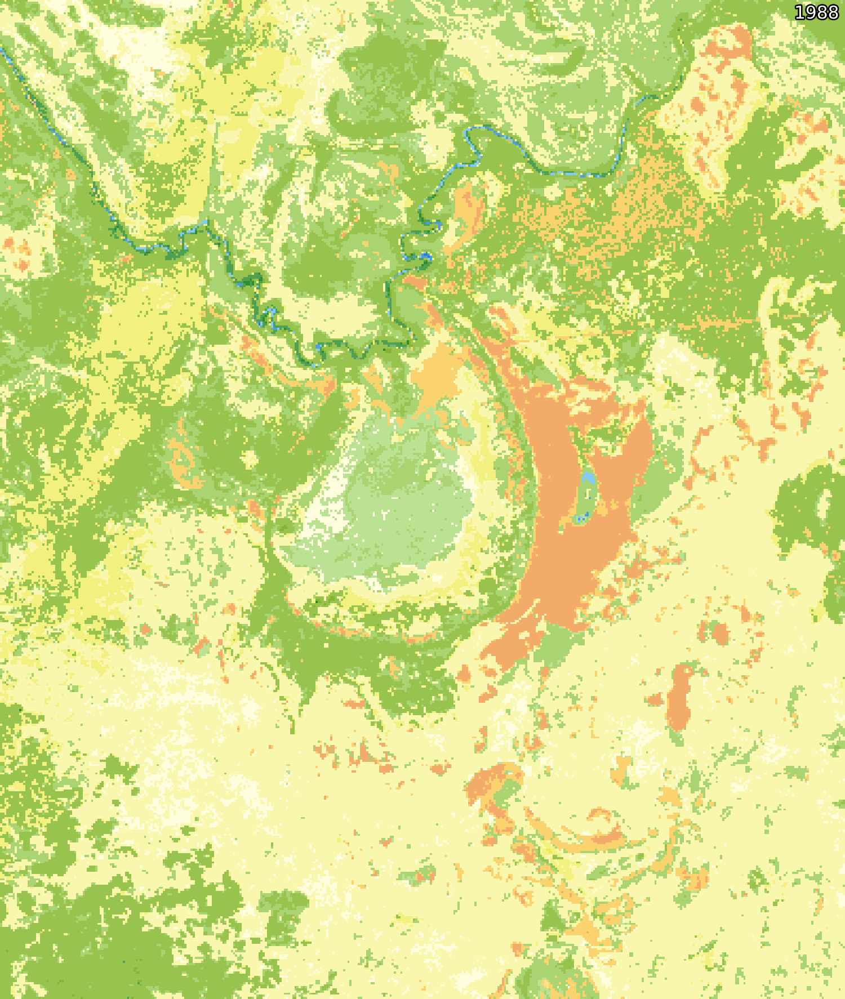

In [9]:
# Select Level 4
level_4 = land_cover_data["level4"]

# Set file name
file_name = "level_4_no_ticks_example"

# Generate plot
lc_animation(level_4, file_name=file_name, label_ax=False)

## Why is my animation producing an error or plotting no data? 

`lc_animation()` uses the name of the `xarray.DataArray` to identify what colour map should be used to create the animation. 
If, in your analysis, you have created a new `xarray.DataArray` object you will need to ensure that you either:
1. Name the `xarray.DataArray` after the layer being plotted.
2. Use the `measurement` setting for `lc_animation()` to specify the layer. 

Plotting a layer with the incorrect colour map will result in an error or the data being plotted as nodata. 

In the next cell we do some analysis on the Level 3 classification to isolate one class. When looking at this new `xarray.DataArray`, we can see that the name is now different (`"Bare_only"` compared to `"level3"`).

In [10]:
# Select Level 3
level_3 = land_cover_data["level3"]

# Do some data manipulation then create a new Xarray.DataArray 
# with a new layer name "ntv_only"

data = np.where(level_3 == 216, level_3, 0)
xr_bare = xr.DataArray(data=data,
                        coords=level_3.coords,
                        dims=level_3.dims, name="Bare_only",
                        attrs=None, indexes=level_3.indexes, fastpath=False)

xr_bare

<xarray.DataArray 'Bare_only' (time: 33, y: 472, x: 399)>
array([[[  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]],

       [[  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]],

       [[  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        ...,
...
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]],

       [[  0, 216, 216, ..., 216, 216, 216],
        [216, 216, 216, ...,   0,   0,   0],
        [216, 216, 216, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0, 216],
        [  0,   0,   0, ...,   0,   0, 216],
        [  0,   0,   0, ...,   0,   0,   0]],

       [[  0, 216, 216, ..., 216, 216, 216],
        [216, 216, 216, ..., 216,   0, 216],
        [216, 216, 216, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0, 216],
        [  0,   0,   0, ...,   0,   0, 216]]], dtype=uint8)
Coordinates:
  * time         (time) datetime64[ns] 1988-01-01 1989-01-01 ... 2020-01-01
  * y            (y) float64 -3.755e+06 -3.755e+06 ... -3.767e+06 -3.767e+06
  * x            (x) float64 8.378e+05 8.378e+05 ... 8.477e+05 8.478e+05
    spatial_ref  int32 3577

If we try to generate an animation for this without specifying which DEA Land Cover classification should be used to colour the plot, we will get an error. In order to avoid getting this error, we provide the name of the classification being used to the 'measurement' variable. In this case, the measurement being used is `"level3"`. 

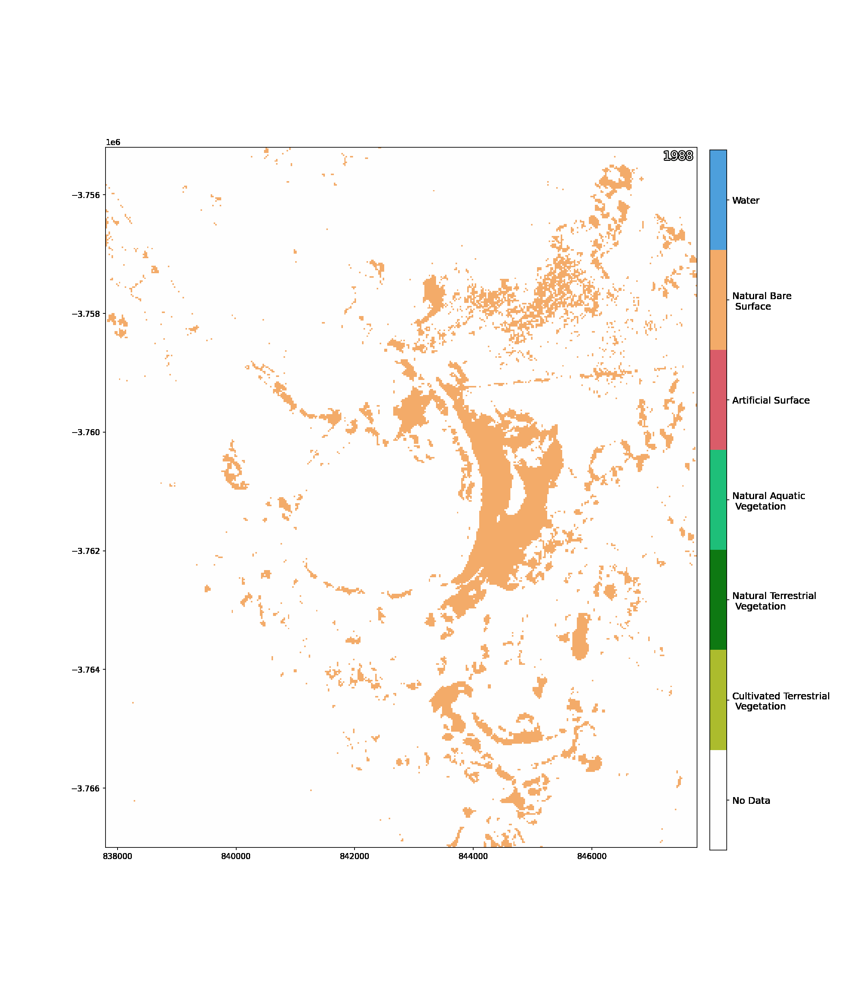

In [11]:
# Set file name
file_name = "bare_surface_example"

# Generate plot
lc_animation(xr_bare, measurement='level3', file_name=file_name, colour_bar=True, width_pixels=15)

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Australia data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/GeoscienceAustralia/dea-notebooks).

**Last modified:** February 2022

**Compatible datacube version:** 

In [12]:
print(datacube.__version__)

1.8.6


## Tags
Browse all available tags on the DEA User Guide's [Tags Index](https://docs.dea.ga.gov.au/genindex.html)